<a href="https://colab.research.google.com/github/nannthd/project_AIEngineer/blob/main/license_plate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install YOLOv8

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.2/78.2 GB disk)


In [ ]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 35.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 56.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 30.0 MB/s eta 0:00:00


In [ ]:
!pip install pytube opencv-python-headless

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.1 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

## Custom Training

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="AWtZRbYK04sFZNNZ1t4X")
project = rf.workspace("projectaiengineer").project("license-plates-gpj5f")
version = project.version(2)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


In [ ]:
%cat {dataset.location}/data.yaml

names:
- number
- province
nc: 2
roboflow:
  license: CC BY 4.0
  project: license-plates-gpj5f
  url: https://universe.roboflow.com/projectaiengineer/license-plates-gpj5f/dataset/2
  version: 2
  workspace: projectaiengineer
test: test/images
train: train/images
val: valid/images


In [ ]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [ ]:
%cat {dataset.location}/data.yaml

names:
- number
- province
nc: 2
roboflow:
  license: CC BY 4.0
  project: license-plates-gpj5f
  url: https://universe.roboflow.com/projectaiengineer/license-plates-gpj5f/dataset/2
  version: 2
test: ../test/images
train: ../train/images
val: ../valid/images


## Custom Training

In [ ]:
%cd {HOME}

!yolo task=detect mode=train epochs=20 imgsz=640 batch=8 plots=True \
model=yolov8n.pt \
data={dataset.location}/data.yaml \
dropout=0.3

/content
100% 6.23M/6.23M [00:00<00:00, 240MB/s]
New https://pypi.org/project/ultralytics/8.2.38 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/-license-plates-2/data.yaml, epochs=20, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.3, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=F

In [ ]:
!ls {HOME}/runs/detect/train/

args.yaml					    R_curve.png		val_batch0_labels.jpg
confusion_matrix_normalized.png			    results.csv		val_batch0_pred.jpg
confusion_matrix.png				    results.png		val_batch1_labels.jpg
events.out.tfevents.1718939594.1d6c50ee4138.1075.0  train_batch0.jpg	val_batch1_pred.jpg
F1_curve.png					    train_batch1.jpg	val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch2.jpg	val_batch2_pred.jpg
labels.jpg					    train_batch750.jpg	weights
P_curve.png					    train_batch751.jpg
PR_curve.png					    train_batch752.jpg


In [ ]:
from IPython.display import Image, clear_output

/content


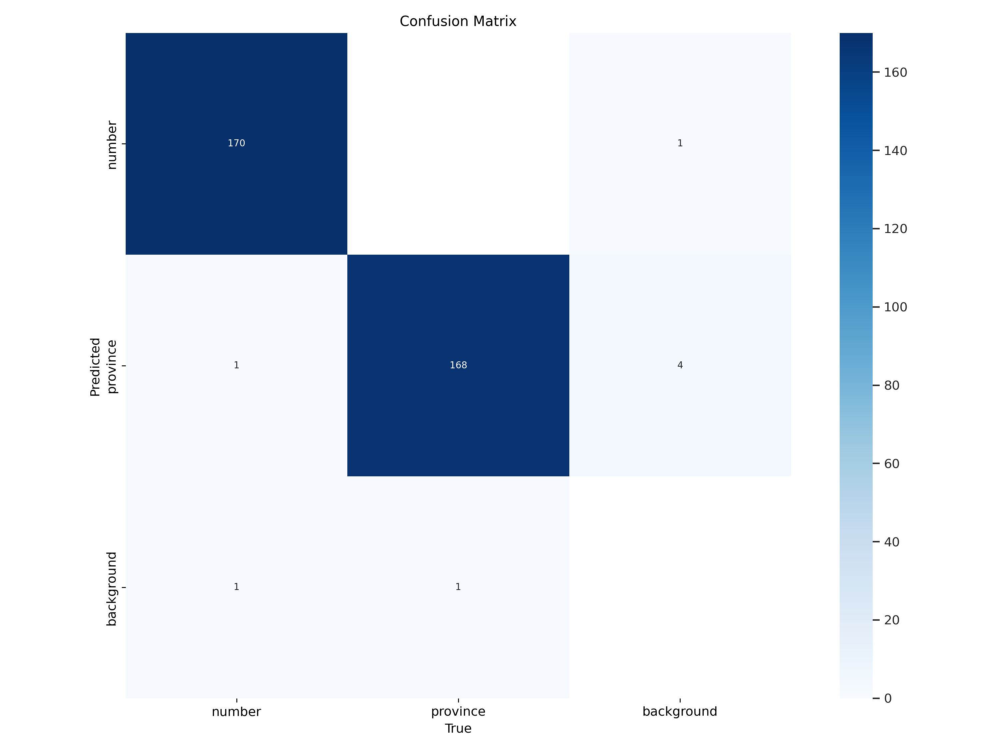

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/content


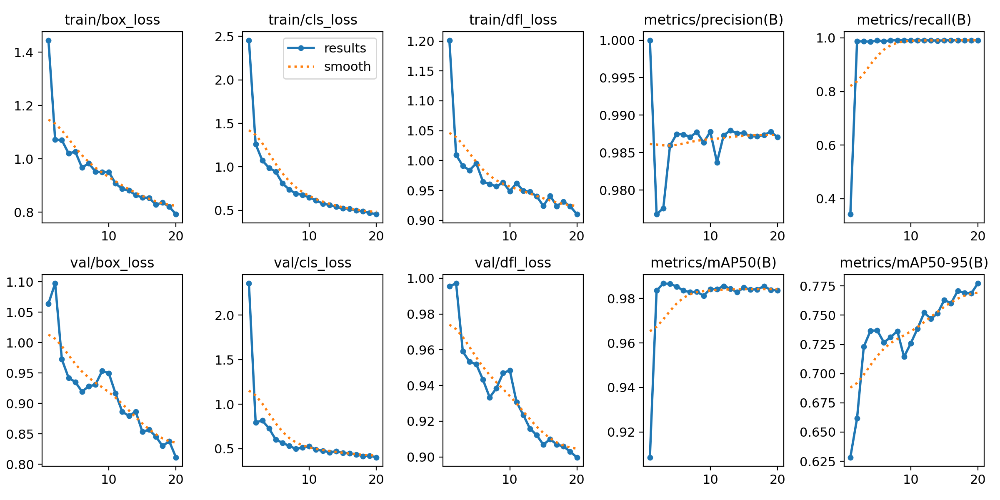

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

## Inference with Custom Model

**NOTE:** Let's start by loading our newly trained model.

In [ ]:
!pip install supervision
import supervision as sv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.0/124.0 kB 3.8 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

model = YOLO(f'{HOME}/runs/detect/train/weights/best.pt')

dataset = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/valid/images",
    annotations_directory_path=f"{dataset.location}/valid/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()

**NOTE:** Let's randomly select an image from our validation set and visualize the results.


0: 640x640 1 number, 1 province, 16.6ms
Speed: 2.2ms preprocess, 16.6ms inference, 9.0ms postprocess per image at shape (1, 3, 640, 640)


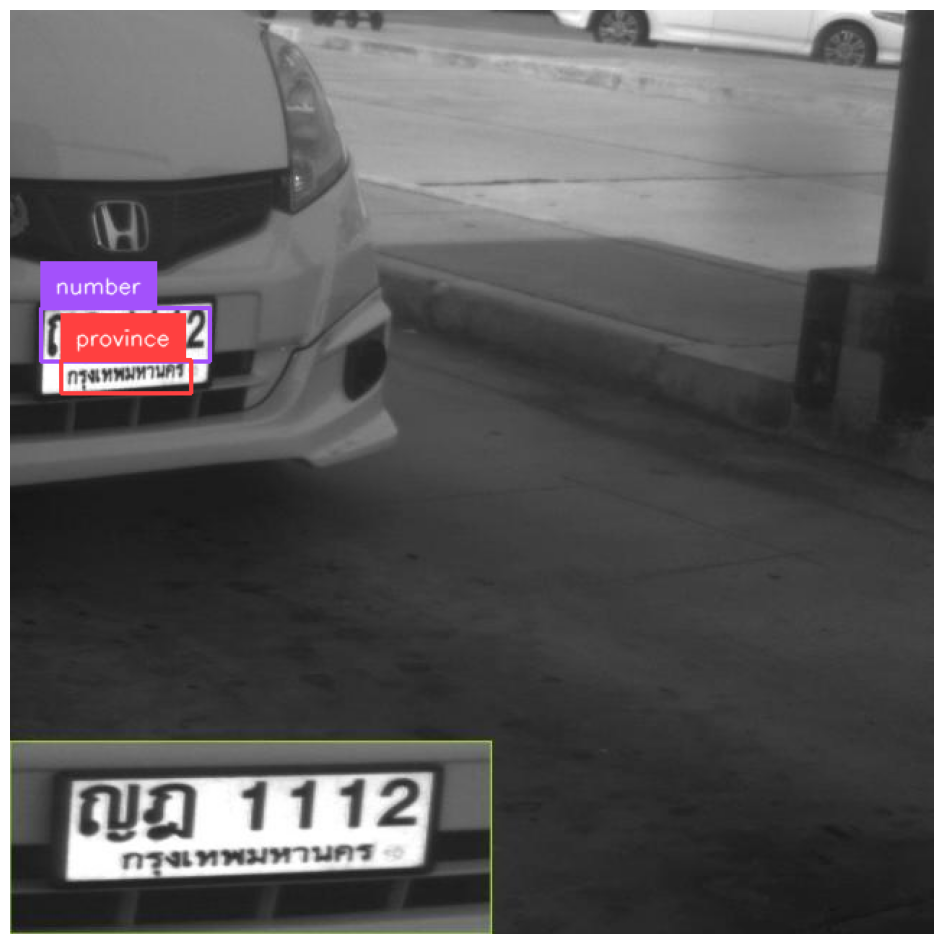

In [ ]:
import random

random_image = random.choice(list(dataset.images.keys()))
random_image = dataset.images[random_image]

results = model(source=random_image, conf=0.25)[0]
detections = sv.Detections.from_ultralytics(results)

annotated_image = bounding_box_annotator.annotate(
    scene=random_image, detections=detections)
annotated_image = label_annotator.annotate(
    scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

In [ ]:
pred = model.predict(random_image, save=True)
pred


0: 640x640 1 number, 1 province, 10.1ms
Speed: 2.5ms preprocess, 10.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'number', 1: 'province'}
 orig_img: array([[[  8,   8,   8],
         [  8,   8,   8],
         [  8,   8,   8],
         ...,
         [  9,   9,   9],
         [  9,   9,   9],
         [  9,   9,   9]],
 
        [[  8,   8,   8],
         [  8,   8,   8],
         [  8,   8,   8],
         ...,
         [  9,   9,   9],
         [  9,   9,   9],
         [  9,   9,   9]],
 
        [[  8,   8,   8],
         [  8,   8,   8],
         [  8,   8,   8],
         ...,
         [  9,   9,   9],
         [  9,   9,   9],
         [  9,   9,   9]],
 
        ...,
 
        [[ 90, 142, 119],
         [  0,  36,  14],
         [  0,  29,  11],
         ...,
         [  9,   9,   9],
         [  9,   9,   9],
         [  9,   9,   9]],
 
        [[ 70, 128, 103],
         [  0,  38,  15],
         [  0,  41,  19],
         ...,
         [  9,

In [ ]:
image_test = "/content/-license-plates-2/test/images"

In [ ]:
pred = model.predict(image_test, save=True)
pred


image 1/85 /content/-license-plates-2/test/images/CH1_20150510114958_-4894_jpg.rf.3022ea6360fe09caa6565301071100b3.jpg: 640x640 1 number, 1 province, 11.1ms
image 2/85 /content/-license-plates-2/test/images/CH1_20150510115610_3-1840_jpg.rf.ca70166b5edfd5d9fd8b4aea48db3b83.jpg: 640x640 1 number, 1 province, 25.5ms
image 3/85 /content/-license-plates-2/test/images/CH1_20150510115910_3-2589_jpg.rf.a958732bf784a6be3d3cfa9810e56b8f.jpg: 640x640 1 number, 1 province, 15.3ms
image 4/85 /content/-license-plates-2/test/images/CH1_20150510121948_-2296_jpg.rf.5b098f983208cd879511d441eeb15978.jpg: 640x640 1 number, 1 province, 9.0ms
image 5/85 /content/-license-plates-2/test/images/CH1_20150510122105_-4992_jpg.rf.ae398f588cff0bb5aaf02dc1ce73ea20.jpg: 640x640 1 number, 1 province, 11.5ms
image 6/85 /content/-license-plates-2/test/images/CH1_20150510122710_2-2773_jpg.rf.072cba6c56c43e8d41aa87fae094028d.jpg: 640x640 1 number, 1 province, 12.6ms
image 7/85 /content/-license-plates-2/test/images/CH1_2

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'number', 1: 'province'}
 orig_img: array([[[ 15,  15,  15],
         [ 15,  15,  15],
         [ 15,  15,  15],
         ...,
         [ 13,  13,  13],
         [ 13,  13,  13],
         [ 14,  14,  14]],
 
        [[ 13,  13,  13],
         [ 14,  14,  14],
         [ 16,  16,  16],
         ...,
         [ 13,  13,  13],
         [ 13,  13,  13],
         [ 14,  14,  14]],
 
        [[ 11,  11,  11],
         [ 13,  13,  13],
         [ 17,  17,  17],
         ...,
         [ 12,  12,  12],
         [ 13,  13,  13],
         [ 13,  13,  13]],
 
        ...,
 
        [[ 90, 136, 114],
         [  0,  28,   7],
         [  0,  17,   0],
         ...,
         [ 23,  23,  23],
         [ 23,  23,  23],
         [ 24,  24,  24]],
 
        [[ 70, 125, 100],
         [  0,  31,   9],
         [  0,  30,   9],
         ...,
         [ 23,

In [ ]:
import os

directory = '/content/runs/detect/predict2'

# ตรวจสอบว่าไดเรกทอรีนี้มีไฟล์ภาพหรือไม่
if os.path.isdir(directory):
    # หากมีไฟล์ภาพในไดเรกทอรี
    image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    if image_files:
        print("รูปภาพทั้งหมดในไดเรกทอรี:")
        for image_file in image_files:
            print(image_file)
    else:
        print("ไม่พบไฟล์ภาพในไดเรกทอรี")
else:
    print("ไม่พบไดเรกทอรีที่ระบุ")

รูปภาพทั้งหมดในไดเรกทอรี:
CH1_20150510144848_2-3670_jpg.rf.3e49a2df1c8cc1238096419c04632170.jpg
CH1_20150510213255_-829_jpg.rf.d3041a6eefa89289cb8995f7548a706c.jpg
CH1_20150510175946_-3889_jpg.rf.2b87ae0af0f86da5d9235d1de1ef8266.jpg
CH1_20150510180142_3-5738_jpg.rf.7c4e4950eee1a161e22600b771b5397c.jpg
CH1_20150510134410_3-6486_jpg.rf.cc00968c8c9a8ecc4a49f6c228c6acdc.jpg
CH1_20150510123205_3-2696_jpg.rf.ca7cdfe7b540231e5d8e805aa3a8991e.jpg
CH1_20150510142723_-707_jpg.rf.94015194f7d44f530518af99903568de.jpg
CH1_20150510225425_1-7516_jpg.rf.7c1e73f430ccb11f91cd9fd6851afa63.jpg
CH1_20150510115610_3-1840_jpg.rf.ca70166b5edfd5d9fd8b4aea48db3b83.jpg
CH1_20150510153851_-1272_jpg.rf.15387151f12b5568b1cca395b3569118.jpg
CH1_20150510195832_0000000000_jpg.rf.19b756dd275c072b739fb2d3c42dfc24.jpg
CH1_20150510203920_3-8225_jpg.rf.d4be7406766d223c2ff18263b9d112c1.jpg
CH1_20150510162337_-4663_jpg.rf.dc62723adb9a4f6a24a21a939614a64f.jpg
CH1_20150510180323_-6598_jpg.rf.c759aee84bb5c0e774e348a103ac8eaf.jp

In [ ]:
import os

directory = '/content/runs/detect/predict2'

# ตรวจสอบว่าไดเรกทอรีนี้มีไฟล์ภาพหรือไม่
if os.path.isdir(directory):
    # หากมีไฟล์ภาพในไดเรกทอรี
    image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    # นับจำนวนไฟล์ภาพ
    num_images = len(image_files)

    print(f"จำนวนรูปภาพทั้งหมดในไดเรกทอรีคือ: {num_images}")
else:
    print("ไม่พบไดเรกทอรีที่ระบุ")

จำนวนรูปภาพทั้งหมดในไดเรกทอรีคือ: 85


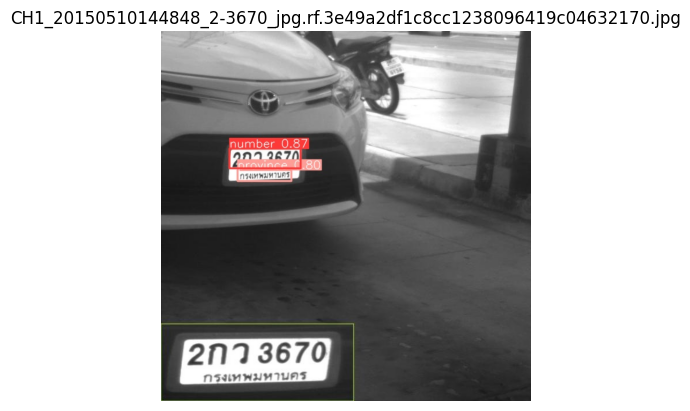

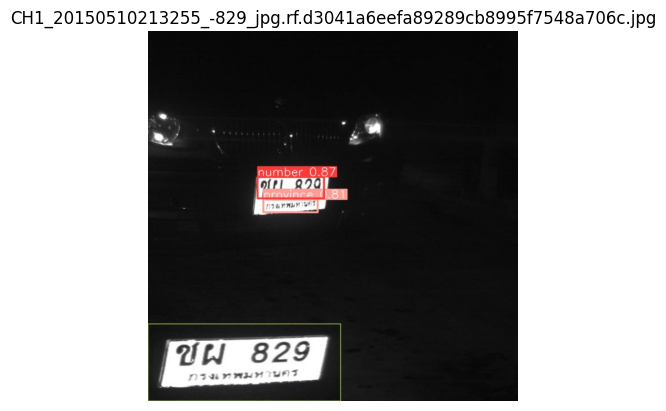

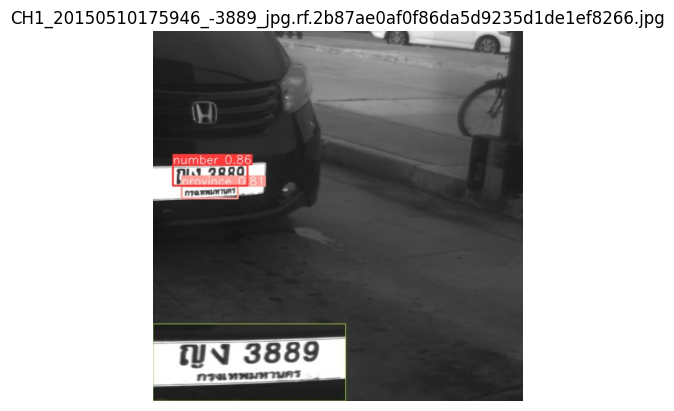

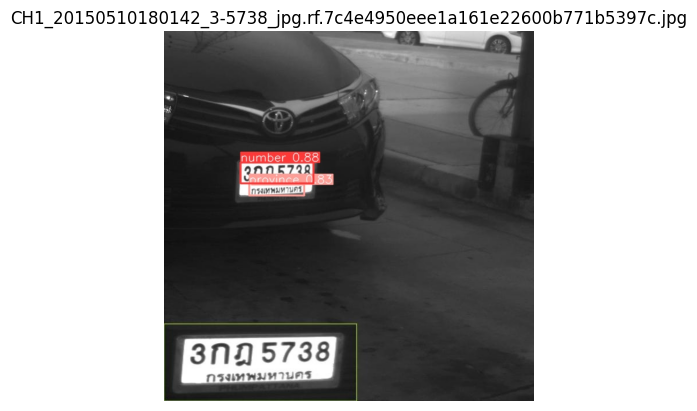

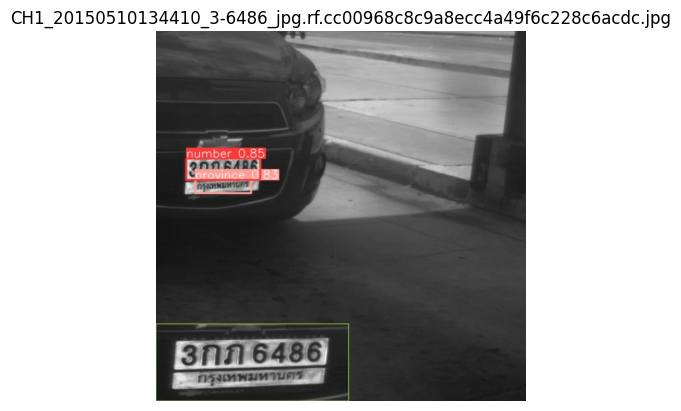

...

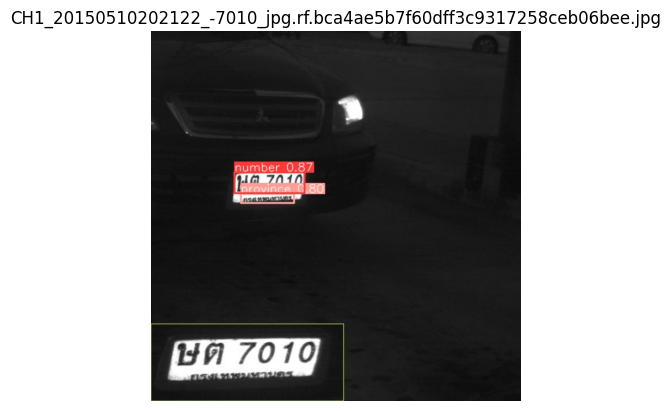

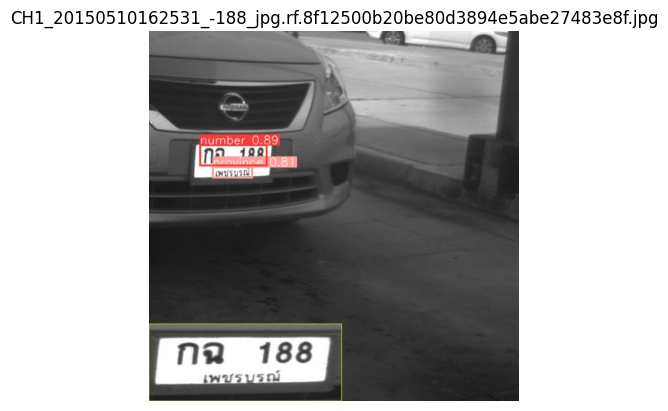

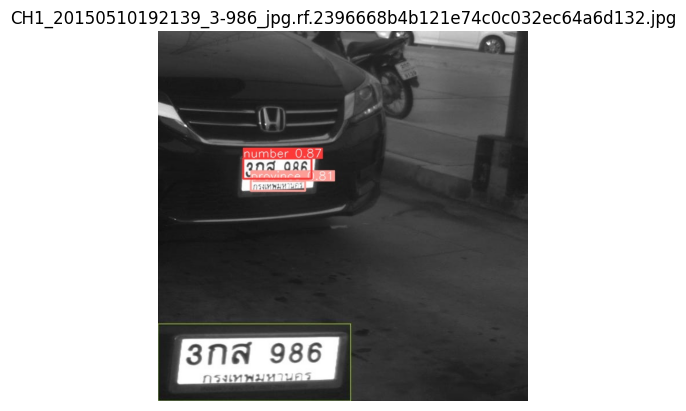

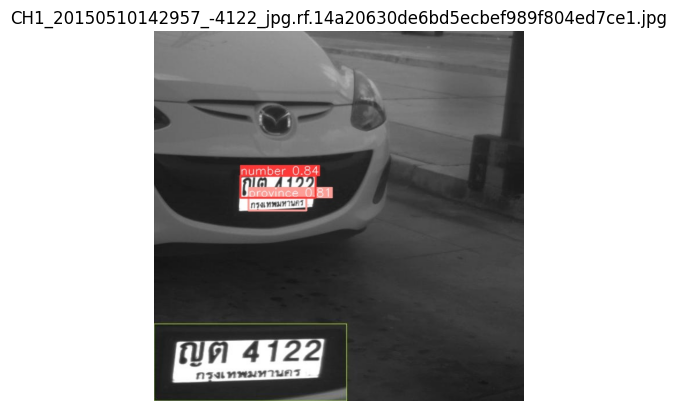

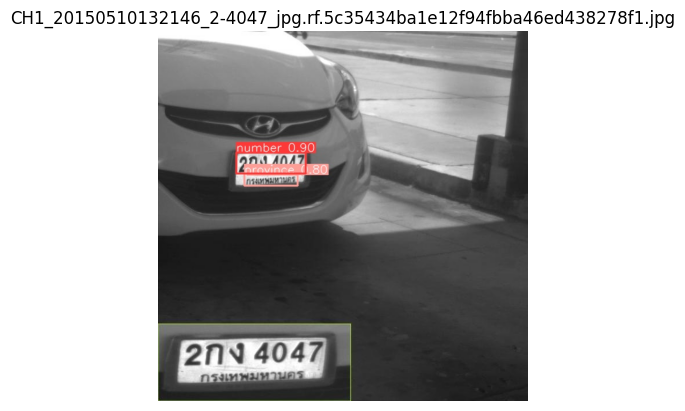

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

directory = '/content/runs/detect/predict2'

# ตรวจสอบว่าไดเรกทอรีนี้มีไฟล์ภาพหรือไม่
if os.path.isdir(directory):
    # หากมีไฟล์ภาพในไดเรกทอรี
    image_files = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    # แสดงภาพทีละภาพ
    for image_file in image_files:
        image_path = os.path.join(directory, image_file)
        img = mpimg.imread(image_path)

        plt.imshow(img)
        plt.title(image_file)
        plt.axis('off')  # ปิดแกน X และ Y
        plt.show()
else:
    print("ไม่พบไดเรกทอรีที่ระบุ")

In [ ]:
result = model.val()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
val: Scanning /content/-license-plates-2/valid/labels.cache... 171 images, 0 backgrounds, 0 corrupt: 100%|██████████| 171/171 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 223, len(boxes) = 341. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.20it/s]
                   all        171        341      0.987      0.991      0.984      0.778
                number        171        172      0.994      0.988      0.984      0.823
              province        171        169       0.98      0.994      0.983      0.733
Speed: 2.9ms preprocess, 6.5ms inference, 0.0ms loss, 1.6ms postprocess per image
Results sa

#Read Text From Image

In [60]:
!apt-get update
!apt-get install -y tesseract-ocr

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:6 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 257 kB in 2s (118 kB/s)
Reading package lists... Done
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly insta

In [ ]:
!pip install pytesseract

In [62]:
!pip install pillow

In [ ]:
!git clone https://github.com/tesseract-ocr/tesseract